In [54]:
from typing import List, Tuple, Dict, Any, Union

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools

from pathlib import Path

from PIL import Image

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping  # Regularization method to prevent the overfitting
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers

from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report

In [55]:
# Making sure GPU is available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


# Introduction and problem statement

We acquired a public dataset of images from small to medium scale chicken farms which was generated in the Arusha and Kilimanjaro regions in Tanzania between September 2020 and February 2021. The dataset provides about 8000 annotated images in 4 classes: "Coccidiosis" ,"Healthy", "New Castle Disease", and "Salmonella". The images are resized to 224px by 224px.

The task in the following is to built a convolutional network based on transfer learning in order to classify the pictures correctly.


**References**  
https://www.kaggle.com/datasets/allandclive/chicken-disease-1 

# Data preparation and visualisation

In [56]:
# Load the classification data
df = pd.read_csv('train_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8067 entries, 0 to 8066
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   images  8067 non-null   object
 1   label   8067 non-null   object
dtypes: object(2)
memory usage: 126.2+ KB


In [57]:
df.head()

,images,label
0,salmo.1558.jpg,Salmonella
1,cocci.1866.jpg,Coccidiosis
2,cocci.171.jpg,Coccidiosis
3,salmo.1484.jpg,Salmonella
4,ncd.100.jpg,New Castle Disease


In [58]:
# Some base data about the dataset
basedir = 'Train'
fn = Path(basedir) / df.sample(1)['images'].values[0]
im = Image.open(fn)
img_size = im.size
# Number of channels (3 for colour)
color = 'rgb'
channels = 3
input_shape = (img_size[0], img_size[1], channels)

In [59]:
def get_train_val_test_dataset(df:pd.DataFrame, basedir:str="Train",train_size:float=.8, random_state:int=42)->Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Split the dataset into train, validation, and test sets.

    Args:
        df (pd.DataFrame): The input DataFrame containing the dataset.
        basedir (str, optional): The base directory where the images are located. Defaults to "Train".
        train_size (float, optional): The proportion of the dataset to include in the train set. Validation and test are then split 50:50. Defaults to 0.8.
        random_state (int, optional): The random seed for reproducibility. Defaults to 42.

    Returns:
        Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]: A tuple containing the train, validation, and test DataFrames.
    """
    if not Path(basedir).exists():
        raise ValueError(f"{basedir} does not exist")
    df ['path'] = [str(Path(basedir)/image) for image in df['images']]
    
    train_df, dummy_df = train_test_split(df, train_size=train_size, random_state=random_state, stratify= df['label'])
    val_df, test_df = train_test_split(dummy_df, train_size=0.5, random_state=random_state, stratify= dummy_df['label'])

    return train_df, val_df, test_df

In [60]:
def generate_sets(train_df:pd.DataFrame, val_df:pd.DataFrame, test_df:pd.DataFrame, img_size, batch_size=128, test_batch_size=128, color='rgb')->Tuple[ImageDataGenerator, ImageDataGenerator, ImageDataGenerator]:
    """
    Generate image data generators for training, validation, and testing sets.

    Parameters:
    train_df (pd.DataFrame): DataFrame containing training data.
    val_df (pd.DataFrame): DataFrame containing validation data.
    test_df (pd.DataFrame): DataFrame containing testing data.
    img_size: Target size of the images.
    batch_size (int): Batch size for training and validation data generators. Default is 128.
    test_batch_size (int): Batch size for testing data generator. Default is 128.
    color (str): Color mode for the images. Default is 'rgb'.

    Returns:
    Tuple[ImageDataGenerator, ImageDataGenerator, ImageDataGenerator]: A tuple containing the training, validation, and testing data generators.
    """

    # This function which will be used in image data generator for data augmentation, it just take the image and return it again.
    def scalar(img):
        return img
    
    train_datagen = ImageDataGenerator(preprocessing_function = scalar, 
                                       horizontal_flip=True, vertical_flip=True, 
                                       height_shift_range=0.1, width_shift_range=0.1,
                                       brightness_range=(0.5,1.5),
                                       zoom_range = [1, 1.5],
                                       rotation_range=30, fill_mode='nearest')
    val_datagen = ImageDataGenerator(preprocessing_function = scalar)

    train_gen = train_datagen.flow_from_dataframe(train_df, x_col= 'path', y_col= 'label', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= True, batch_size= batch_size)

    val_gen = val_datagen.flow_from_dataframe(val_df, x_col= 'path', y_col= 'label', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= True, batch_size= batch_size)
    
    test_gen = val_datagen.flow_from_dataframe(test_df, x_col= 'path', y_col= 'label', target_size= img_size, class_mode= 'categorical',
                                        color_mode= color, shuffle= False, batch_size= test_batch_size)

    return train_gen, val_gen, test_gen

In [61]:
def display_sample_images(generator, sample_size:int=25):
    """
    Display a sample of images from a generator.

    Args:
        generator (keras.preprocessing.image.DirectoryIterator): The generator object that generates batches of images.
        sample_size (int, optional): The number of images to display. Defaults to 25.

    Returns:
        None
    """

    # Get the classes and their names
    class_indices = generator.class_indices
    classes = list(class_indices.keys())
    # Obtain a batch of images
    images, labels = next(generator)

    # calculate number of displayed samples
    length = len(labels)
    sample = min(length, sample_size)

    plt.figure(figsize= (20, 20))

    for i in range(sample):
        # add a subplot in the grid of 5x5, at i+1th position
        plt.subplot(5, 5, i + 1)
        # rescale the image
        image = images[i]/255   
        plt.imshow(image)
        # get the label for the image for the title
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, fontsize= 12)
        plt.axis('off')
    plt.show()

In [62]:
# Set the batch size - larger means faster, but more memory usage
batch_size = 16
# Get the train, validation, and test datasets
train_df, val_df, test_df = get_train_val_test_dataset(df)
test_length = len(test_df)
# Obtain the largest batch size that can be used for testing, such that each step has a full batch of inputs
test_batch_size = max(sorted([test_length // n for n in range(1, test_length + 1) if test_length%n == 0 and test_length/n <= 80]))
# Generate the image data generators
train_gen, val_gen, test_gen = generate_sets(train_df, val_df, test_df, img_size, batch_size=batch_size, test_batch_size=test_batch_size)


Found 6453 validated image filenames belonging to 4 classes.
Found 807 validated image filenames belonging to 4 classes.
Found 807 validated image filenames belonging to 4 classes.


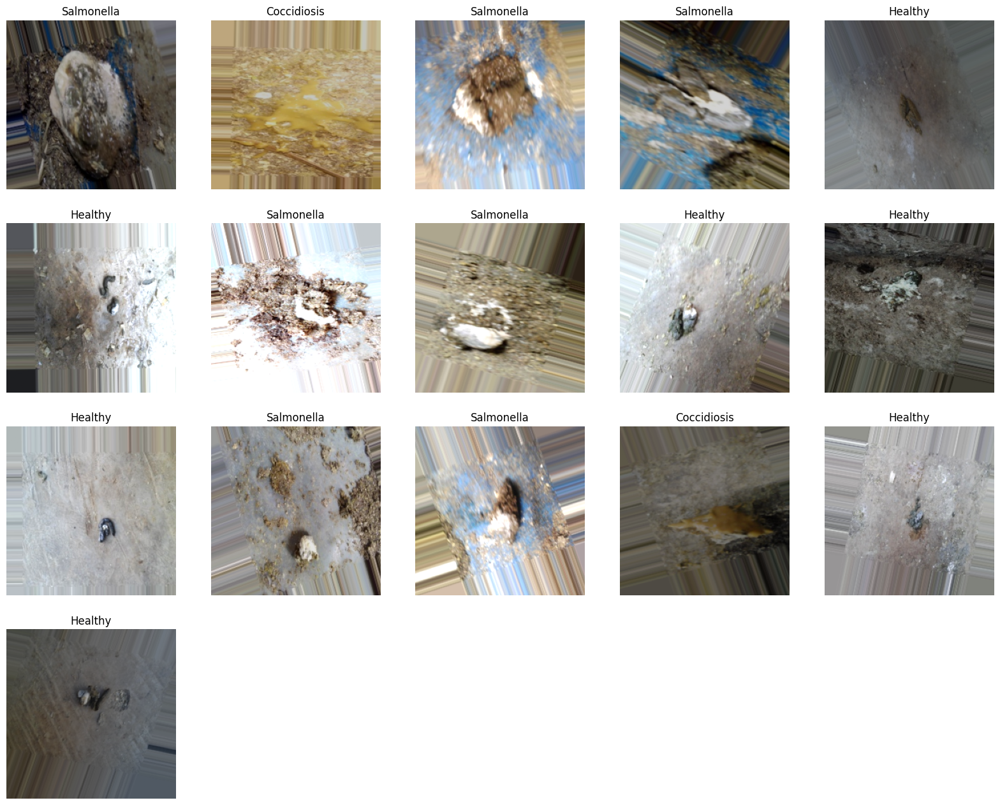

In [63]:
# Show some sample images
display_sample_images(train_gen)

# Modelling

In [64]:
# Create Model Structure

# Obtain the classes and their number
classes = list(train_gen.class_indices.keys())
class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in the Dense layer

# Use a pre-trained base model, in this case EfficientNetB0 which is trained for 224x224 images
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top= False, weights= "imagenet", classes=class_count, input_shape=input_shape, pooling= 'max')
# Define the model
model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l2= 0.016), activity_regularizer= regularizers.l1(0.006),
               bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])
# Compile the model
model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])
# And show the model summary for control
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 batch_normalization_1 (Batc  (None, 1280)             5120      
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 256)               327936    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 4,383,655
Trainable params: 4,339,072
Non-trainable params: 44,583
_______________________________________

In [65]:
# Callbacks to prevent overfitting and to save the best model
es = EarlyStopping(monitor = 'val_accuracy', mode = 'max', verbose = 1, patience = 50)
mc = ModelCheckpoint("cdp.weights.h5", monitor = 'val_accuracy', mode = 'max', save_weights_only=True, verbose = 1, save_best_only = True)
# Max epochs
epochs=50
# Fit the model
history = model.fit(
    train_gen,
    # steps_per_epoch = train_gen.samples // batch_size,
    validation_data = val_gen, 
    validation_steps = None, # val_gen.samples // batch_size,
    shuffle= False,
    epochs = epochs,
    callbacks = [es,mc]
)

Epoch 1/50
404/404 [==============================] - ETA: 0s - loss: 5.7124 - accuracy: 0.8553
Epoch 1: val_accuracy improved from -inf to 0.90706, saving model to cdp.weights.h5
404/404 [==============================] - 66s 149ms/step - loss: 5.7124 - accuracy: 0.8553 - val_loss: 3.7366 - val_accuracy: 0.9071
Epoch 2/50
404/404 [==============================] - ETA: 0s - loss: 2.6358 - accuracy: 0.9283
Epoch 2: val_accuracy improved from 0.90706 to 0.97274, saving model to cdp.weights.h5
404/404 [==============================] - 63s 155ms/step - loss: 2.6358 - accuracy: 0.9283 - val_loss: 1.7157 - val_accuracy: 0.9727
Epoch 3/50
404/404 [==============================] - ETA: 0s - loss: 1.2887 - accuracy: 0.9442
Epoch 3: val_accuracy did not improve from 0.97274
404/404 [==============================] - 62s 153ms/step - loss: 1.2887 - accuracy: 0.9442 - val_loss: 0.8612 - val_accuracy: 0.9566
Epoch 4/50
404/404 [==============================] - ETA: 0s - loss: 0.7001 - accuracy:

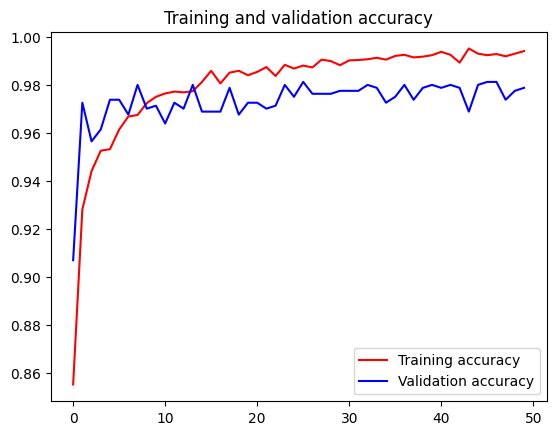

<Figure size 640x480 with 0 Axes>

In [66]:
# Plot the training and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

# Evaluation of the best model

In [67]:
# Recover the best model by loading the stored weights
model.load_weights("cdp.weights.h5")

In [68]:
# Obtain the model scores for train, test, and validation sets
train_score = model.evaluate(train_gen, verbose= 1)
valid_score = model.evaluate(val_gen,   verbose= 1)
test_score  = model.evaluate(test_gen,  verbose= 1)

scores = pd.DataFrame({'Train': train_score, 'Validation': valid_score, 'Test': test_score}, index=['Loss', 'Accuracy'])
scores.round(3)

269/269 [==============================] - 3s 12ms/step - loss: 0.2143 - accuracy: 0.9690


,Train,Validation,Test
Loss,0.107,0.173,0.214
Accuracy,0.993,0.981,0.969


In [69]:
# Obtain predictions
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)
# obtain the test classes
classes = list(test_gen.class_indices.keys())

269/269 [==============================] - 4s 11ms/step


In [70]:
def plot_confusion_matrix(cm:np.array, classes:list, normalize:bool=False,cmap=plt.cm.Reds, figsize= (5, 5)):
	"""
	Plot a confusion matrix.

	Parameters:
	- cm (np.array): The confusion matrix to be plotted.
	- classes (list): The list of class labels.
	- normalize (bool): Whether to normalize the confusion matrix. Default is False.
	- cmap (plt.cm.Colormap): The colormap to be used for the plot. Default is plt.cm.Reds.
	- figsize (tuple): The size of the figure. Default is (5, 5).
	"""

	plt.figure(figsize= figsize)
	plt.imshow(cm, interpolation= 'nearest', cmap= cmap)

	tick_marks = np.arange(len(classes))
	plt.xticks(tick_marks, classes, rotation= 45)
	plt.yticks(tick_marks, classes)

	if normalize:
		cm = cm.astype('float') / cm.sum(axis= 1)[:, np.newaxis]
		title = 'Normalized Confusion Matrix'
	else:
		title = 'Confusion Matrix, Without Normalization'
	
	plt.title(title)
	thresh = cm.max() / 2.
	
	for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
		plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

	plt.tight_layout()
	plt.ylabel('True Label')
	plt.xlabel('Predicted Label')

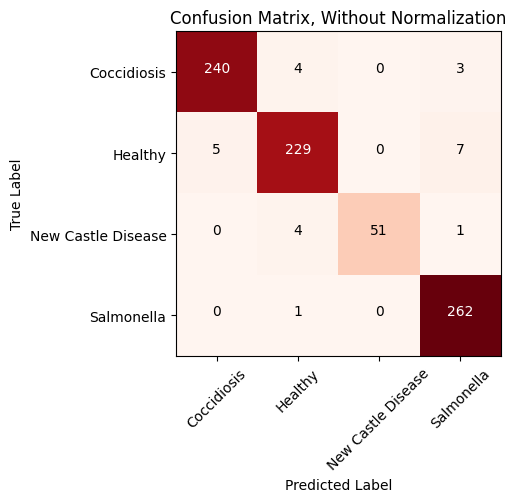

In [71]:
# Plot the confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plot_confusion_matrix(cm= cm, classes= classes)

In [72]:
# And show the classification report
print(classification_report(test_gen.classes, y_pred, target_names= classes))

                    precision    recall  f1-score   support

       Coccidiosis       0.98      0.97      0.98       247
           Healthy       0.96      0.95      0.96       241
New Castle Disease       1.00      0.91      0.95        56
        Salmonella       0.96      1.00      0.98       263

          accuracy                           0.97       807
         macro avg       0.98      0.96      0.97       807
      weighted avg       0.97      0.97      0.97       807



# Visualisation of results

In [73]:
def show_results(df:pd.DataFrame, y_pred:np.array, classes:list, sample_size:int=25, include:str='both', ncols:int=5):
    """
    Display a grid of images with their actual and predicted labels.

    Args:
        df (pd.DataFrame): The DataFrame containing the image data and labels.
        y_pred (np.array): The predicted labels for the images.
        classes (list): The list of class labels.
        sample_size (int, optional): The number of images to display. Defaults to 25.
        include (str, optional): The type of images to include in the display. 
            Possible values are 'both', 'correct', 'incorrect'. Defaults to 'both'.
        ncols (int, optional): The number of columns in the grid. Defaults to 5.
    """
    df['predicted'] = y_pred
    df['predicted'] = df['predicted'].map(lambda x: classes[x])
    match include:
        case 'both':
            sample = df.sample(sample_size)
        case 'correct':
            sample = df[df['label'] == df['predicted']]
            sample = sample.sample(min(len(sample.index),sample_size))
        case 'incorrect':
            sample = df[df['label'] != df['predicted']]
            sample = sample.sample(min(len(sample.index),sample_size))
        case _:
            raise ValueError(f"Invalid value for include: {include}")
    sample_size = len(sample.index)
    nrows = sample_size // ncols
    fig, axs =  plt.subplots(nrows, ncols, figsize= (20, 20))
    for i in range(nrows):
        for j in range(ncols):
            row = sample.iloc[i*ncols + j]
            img = load_img(row['path'], target_size= img_size)
            axs[i, j].imshow(img)
            axs[i, j].set_title(f"Actual: {row['label']}\nPredicted: {row['predicted']}")
            axs[i, j].axis('off')
            
    plt.show()

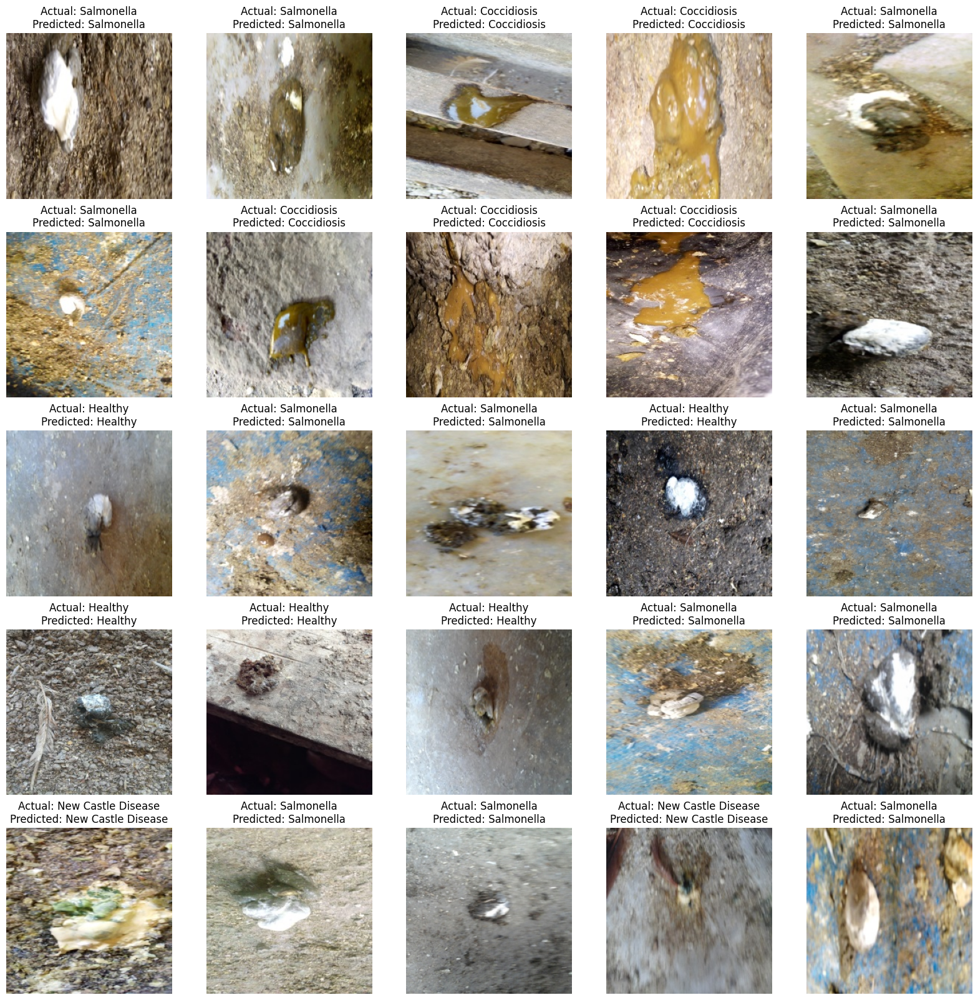

In [74]:
# Show some correctly classified ones
show_results(test_df, y_pred, classes, include='correct')

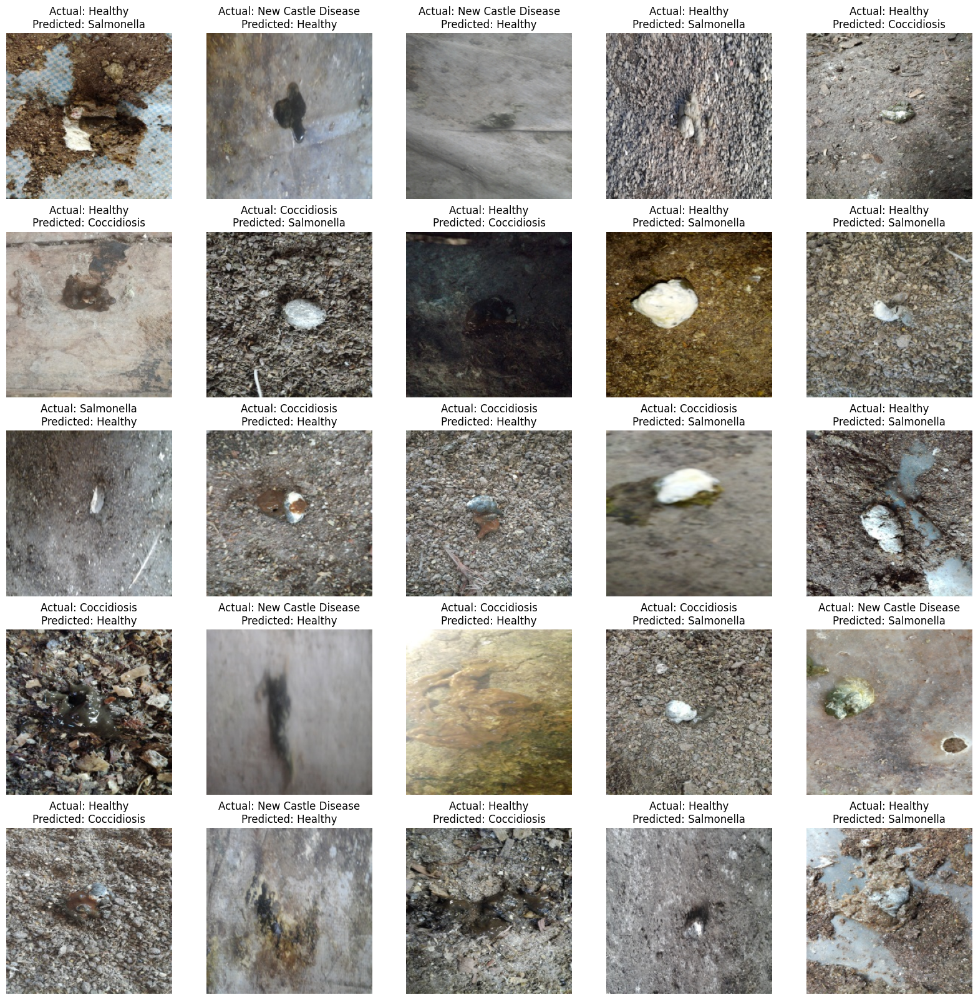

In [75]:
# Show all misqualified ones
show_results(test_df, y_pred, classes, include='incorrect')

# Result summary, potential improvements and next steps

Thanks to the large amounts of single images of good quality of faeces in the different classes, the classification task was very successful. We were able to identify all classes with an $F_1$-score exceeding 95%.

This was made possible by using data augmentation and the excellent EfficientNet

Of course, the images are simple: there is a single dropping on each picture and the lighting conditions in most pictures are good. In practice, we have found that the search for a dropping in a picture is a significant task, in particular under normal lighting conditions in commercial broiler operations. However, this simple example shows that a disease detection based on feaces is feasible.

**Next steps**
- Acquisition of pictures directly from a camera, e.g. a mobile phone
- Localisation of individual faeces, possibly scoring each dropping (for its likelihood to be a dropping) and analysing the best. 
- Creating a simple mobile phone app to classify the dropping and run some statistics

**References:**
Mingxing Tan, Quoc V. Le, EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks, International Conference on Machine Learning, 2019, https://arxiv.org/abs/1905.11946v5  
https://research.google/blog/efficientnet-improving-accuracy-and-efficiency-through-automl-and-model-scaling/